In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



# Cleaning the texts
import re
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer


import folium
from folium.plugins import MarkerCluster


In [2]:
# Import Listing Data

df_listings = pd.read_csv("listings.csv")
review = pd.read_csv("reviews.csv")
# review.rename(columns={'listing_id':'id'}, inplace=True)
# df_listings=pd.merge(df_listings,review,on='id',how='left')
review.isnull().sum()
print( 'data shape :',df_listings.shape, '\nreview data shape :',review.shape )


data shape : (5652, 18) 
review data shape : (256758, 6)


In [3]:
df_listings.head(25)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,21302,the OCEAN HAVEN - pet-friendly,81292,Laurel & Sue,NaN,Surf Coast,-38.465420,144.093090,Entire home/apt,400,4,47,2022-03-15,0.52,5,167,10,NaN
1,27561,Executive residence peaceful locale,119103,Lynn,NaN,Surf Coast,-38.342820,144.305940,Entire home/apt,500,5,1,2019-04-28,0.03,1,79,0,NaN
2,70449,Otway foothills retreat,357052,Craig,NaN,Colac Otway,-38.331100,143.828350,Entire home/apt,231,1,38,2022-02-27,0.43,1,271,7,NaN
3,84516,Sea-Lit - luxury plus stunning ocean views,462049,David,NaN,Moyne,-38.391490,142.220840,Entire home/apt,401,2,109,2022-03-20,1.13,1,237,18,NaN
4,195168,Historic House with Sea Views,899909,Tony,NaN,Surf Coast,-38.541390,143.969390,Entire home/apt,600,2,20,2022-03-14,0.16,1,341,8,NaN
5,291691,BH Sleepout,1511087,Kim,NaN,Greater Geelong,-38.279140,144.490820,Entire home/apt,79,2,60,2020-01-24,0.49,2,300,0,NaN
6,372470,"Charleson Farm - rural escape, breathtaking views",1875131,Charleson,NaN,Surf Coast,-38.339020,144.021330,Entire home/apt,550,2,132,2022-03-19,1.68,1,265,38,NaN
7,403682,"Satis Beach House, Great Ocean Road\nLinen pro...",246509,Fiona,NaN,Surf Coast,-38.465721,144.099136,Entire home/apt,437,2,180,2022-03-15,1.45,1,157,13,NaN
8,479888,Riverbank Cottage Allenvale,2377195,Charles,NaN,Surf Coast,-38.547670,143.955250,Entire home/apt,225,2,58,2022-02-28,0.78,4,56,6,NaN
9,488344,"Seahaven, a room with a view",2416415,Lise,NaN,Surf Coast,-38.463680,144.095430,Entire home/apt,130,1,196,2022-03-06,2.76,2,245,24,NaN


In [4]:
review.head(25)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,21302,22644996,2014-11-11,2976468,Jacqui,"A beautiful, huge house on three levels with a..."
1,21302,23988813,2014-12-16,9002765,Lisa,I stayed at Laurel's place for 4 nights with m...
2,21302,29849662,2015-04-13,23992177,Jo,Fantastic large house with wonderful views of ...
3,21302,34571044,2015-06-09,11125965,Ebony,Perfect house and location for a weekend away ...
4,21302,53072030,2015-11-04,9363534,Jill,"Spectacular house, beautifully furnished and g..."
5,21302,56670132,2015-12-16,40544191,Jane,"Laurel was great at communicating details, ans..."
6,21302,60756886,2016-01-27,6186846,Freddy,Laurel was the perfect host. She made it easy ...
7,21302,73429937,2016-05-08,529168,Stephanie,I booked Laurel's place for my team who were s...
8,21302,74326441,2016-05-14,529168,Stephanie,Laurel was fantastic to deal with - accommodat...
9,21302,74794359,2016-05-16,60019270,Hayes,The house was amazing! Beautiful view of the o...


## Task 1 : Data Pre-Processing

In [5]:
df_listings.isnull().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood_group               5652
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                        448
reviews_per_month                  448
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           5652
dtype: int64

In [6]:
#finding minimum value 
df_listings['reviews_per_month'].min()

0.01

In [7]:
#appliying that 
df_listings['reviews_per_month'].fillna(0.01,inplace=True)



In [8]:
review.isnull().sum()

listing_id        0
id                0
date              0
reviewer_id       0
reviewer_name     1
comments         36
dtype: int64

In [9]:
df_listings.shape

(5652, 18)

In [10]:
df_listings['neighbourhood'].unique()

array(['Surf Coast', 'Colac Otway', 'Moyne', 'Greater Geelong',
       'Queenscliffe', 'Warrnambool', 'Glenelg', 'Southern Grampians',
       'Corangamite'], dtype=object)

In [11]:
df_listings['room_type'].unique()

array(['Entire home/apt', 'Private room', 'Hotel room', 'Shared room'],
      dtype=object)

In [12]:
df_listings.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            0
neighbourhood_group               5652
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
last_review                        448
reviews_per_month                    0
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           5652
dtype: int64

In [13]:
# Unwanted columns have been deleted

df_listings.drop(['id','host_name','license','neighbourhood_group','number_of_reviews_ltm'], axis = 1, inplace = True)



In [14]:
df_listings.head(10)

,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,the OCEAN HAVEN - pet-friendly,81292,Surf Coast,-38.465420,144.093090,Entire home/apt,400,4,47,2022-03-15,0.52,5,167
1,Executive residence peaceful locale,119103,Surf Coast,-38.342820,144.305940,Entire home/apt,500,5,1,2019-04-28,0.03,1,79
2,Otway foothills retreat,357052,Colac Otway,-38.331100,143.828350,Entire home/apt,231,1,38,2022-02-27,0.43,1,271
3,Sea-Lit - luxury plus stunning ocean views,462049,Moyne,-38.391490,142.220840,Entire home/apt,401,2,109,2022-03-20,1.13,1,237
4,Historic House with Sea Views,899909,Surf Coast,-38.541390,143.969390,Entire home/apt,600,2,20,2022-03-14,0.16,1,341
5,BH Sleepout,1511087,Greater Geelong,-38.279140,144.490820,Entire home/apt,79,2,60,2020-01-24,0.49,2,300
6,"Charleson Farm - rural escape, breathtaking views",1875131,Surf Coast,-38.339020,144.021330,Entire home/apt,550,2,132,2022-03-19,1.68,1,265
7,"Satis Beach House, Great Ocean Road\nLinen pro...",246509,Surf Coast,-38.465721,144.099136,Entire home/apt,437,2,180,2022-03-15,1.45,1,157
8,Riverbank Cottage Allenvale,2377195,Surf Coast,-38.547670,143.955250,Entire home/apt,225,2,58,2022-02-28,0.78,4,56
9,"Seahaven, a room with a view",2416415,Surf Coast,-38.463680,144.095430,Entire home/apt,130,1,196,2022-03-06,2.76,2,245


In [15]:
# Replacing all the missing values
df_listings['reviews_per_month'].fillna(0,inplace=True)
review['comments'].fillna(' ',inplace=True)

In [16]:
df_listings['room_type'].value_counts()

Entire home/apt    5055
Private room        564
Hotel room           31
Shared room           2
Name: room_type, dtype: int64

In [17]:
df_listings['calculated_host_listings_count'].max()

291

In [18]:
df_listings['price'] = df_listings['price'].astype('float64')

In [19]:
df_listings.head(10)

,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,the OCEAN HAVEN - pet-friendly,81292,Surf Coast,-38.465420,144.093090,Entire home/apt,400.0,4,47,2022-03-15,0.52,5,167
1,Executive residence peaceful locale,119103,Surf Coast,-38.342820,144.305940,Entire home/apt,500.0,5,1,2019-04-28,0.03,1,79
2,Otway foothills retreat,357052,Colac Otway,-38.331100,143.828350,Entire home/apt,231.0,1,38,2022-02-27,0.43,1,271
3,Sea-Lit - luxury plus stunning ocean views,462049,Moyne,-38.391490,142.220840,Entire home/apt,401.0,2,109,2022-03-20,1.13,1,237
4,Historic House with Sea Views,899909,Surf Coast,-38.541390,143.969390,Entire home/apt,600.0,2,20,2022-03-14,0.16,1,341
5,BH Sleepout,1511087,Greater Geelong,-38.279140,144.490820,Entire home/apt,79.0,2,60,2020-01-24,0.49,2,300
6,"Charleson Farm - rural escape, breathtaking views",1875131,Surf Coast,-38.339020,144.021330,Entire home/apt,550.0,2,132,2022-03-19,1.68,1,265
7,"Satis Beach House, Great Ocean Road\nLinen pro...",246509,Surf Coast,-38.465721,144.099136,Entire home/apt,437.0,2,180,2022-03-15,1.45,1,157
8,Riverbank Cottage Allenvale,2377195,Surf Coast,-38.547670,143.955250,Entire home/apt,225.0,2,58,2022-02-28,0.78,4,56
9,"Seahaven, a room with a view",2416415,Surf Coast,-38.463680,144.095430,Entire home/apt,130.0,1,196,2022-03-06,2.76,2,245


In [20]:
last_review_isnan = df_listings.loc[df_listings['last_review'].isnull()]
last_review_isnan

,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
232,Riverview Beach House,24423216,Warrnambool,-38.392180,142.470990,Entire home/apt,475.0,5,0,NaN,0.01,2,90
438,Beach House,19078908,Surf Coast,-38.544800,143.971950,Entire home/apt,300.0,7,0,NaN,0.01,1,89
519,Bush to Beach Family Oasis.,30570731,Surf Coast,-38.367130,144.249660,Entire home/apt,700.0,4,0,NaN,0.01,1,7
689,Ambrose House- Great for 3 families,62696623,Surf Coast,-38.403090,144.182710,Entire home/apt,350.0,5,0,NaN,0.01,1,54
803,Bass Holiday House,9895204,Surf Coast,-38.315650,144.343040,Entire home/apt,600.0,5,0,NaN,0.01,1,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5647,Beautiful 4 Bedroom home in Ocean Grove.,105403459,Greater Geelong,-38.262905,144.525696,Entire home/apt,500.0,2,0,NaN,0.01,1,30
5648,East View Ocean Vista Family Holiday Retreat,51678707,Surf Coast,-38.307910,144.338040,Entire home/apt,423.0,2,0,NaN,0.01,133,14
5649,Comfortable 4 bedroom home with pool,47007950,Colac Otway,-38.368540,143.590620,Entire home/apt,400.0,1,0,NaN,0.01,1,330
5650,Home away from home!,449026010,Glenelg,-38.366740,141.617230,Entire home/apt,232.0,2,0,NaN,0.01,1,359


In [21]:
df_listings.describe()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,5.652000e+03,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000,5652.000000
mean,1.144371e+08,-38.375619,143.806636,349.526716,2.623142,45.427813,1.340847,33.643312,170.858988
std,1.137943e+08,0.211836,0.844612,310.072336,18.984460,79.492782,1.565322,70.030707,122.371483
min,1.386900e+04,-38.856650,141.001200,20.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,2.990266e+07,-38.480383,143.657410,192.000000,2.000000,4.750000,0.270000,1.000000,59.000000
50%,8.099320e+07,-38.340710,144.171905,288.000000,2.000000,16.000000,0.830000,2.000000,162.000000
75%,1.494917e+08,-38.266068,144.363473,414.000000,2.000000,52.000000,1.850000,22.000000,289.000000
max,4.508844e+08,-37.144337,144.717730,10750.000000,1000.000000,887.000000,15.820000,291.000000,365.000000


# Accommodation distribution on maps

In [22]:
boulder_coords = [-37.2744, 143.7751]
#Create the map
my_map = folium.Map(location = boulder_coords, zoom_start = 7)
#Display the map
my_map
colors = {'Entire home/apt' : 'red', 'Private room' : 'pink','Hotel room':'green','Shared room':'yellow'}
# print(df_listings['minimum_nights'].max())

df_listings.apply(lambda row:folium.RegularPolygonMarker(location=[row["latitude"], row["longitude"]], 
                                              radius=4, fill_color=colors[row['room_type']])
                                             .add_to(my_map), axis=1)
my_map

# Summarize the number of accommodations in each market/ each region

In [23]:
accomodations = df_listings['neighbourhood'].value_counts()

accomodations = pd.DataFrame(accomodations)
accomodations.reset_index(inplace=True)
accomodations.rename(columns={'index':'Neighbourhood', 'neighbourhood':'Number Of Accomodations'}, inplace=True)
accomodations

,Neighbourhood,Number Of Accomodations
0,Surf Coast,1737
1,Greater Geelong,1538
2,Colac Otway,930
3,Moyne,454
4,Warrnambool,304
5,Corangamite,248
6,Queenscliffe,193
7,Glenelg,151
8,Southern Grampians,97


[Text(0, 0, 'Surf Coast'),
 Text(1, 0, 'Greater Geelong'),
 Text(2, 0, 'Colac Otway'),
 Text(3, 0, 'Moyne'),
 Text(4, 0, 'Warrnambool'),
 Text(5, 0, 'Corangamite'),
 Text(6, 0, 'Queenscliffe'),
 Text(7, 0, 'Glenelg'),
 Text(8, 0, 'Southern Grampians')]

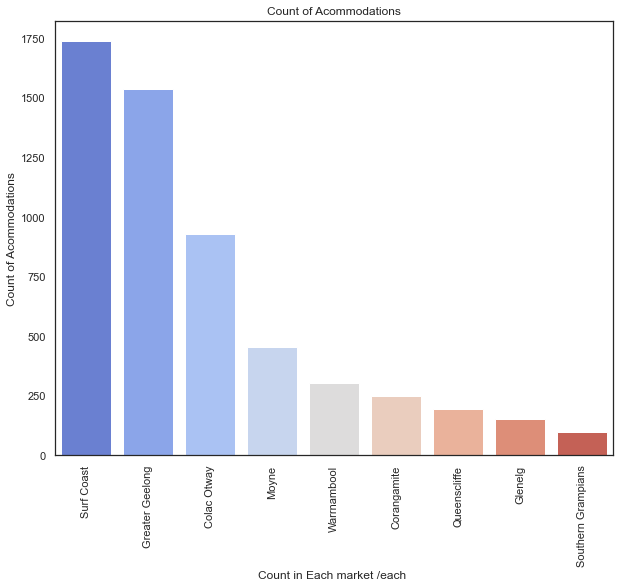

In [24]:
sns.set(rc={'figure.figsize':(10,8)})
sns.set_style('white')

viz_1=sns.barplot(x="Neighbourhood", y="Number Of Accomodations", data=accomodations,
                 palette='coolwarm')
viz_1.set_title('Count of Acommodations')
viz_1.set_ylabel('Count of Acommodations')
viz_1.set_xlabel('Count in Each market /each ')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation =90)

##EDA VISUALISATION
## Summarize the mean price of accommodations in each market/ each region


In [25]:

neighbourhoods_list = ['Surf Coast', 'Greater Geelong', 'Colac Otway', 'Moyne', 'Warrnambool', 'Corangamite', 
                       'Queenscliffe', 'Glenelg', 'Southern Grampians']
price_neighbour=[]
for land in neighbourhoods_list:
    neighbour = df_listings.loc[df_listings['neighbourhood'] == land]
    neighbour.rename(columns={'price':land}, inplace=True)
    price_neighbour.append(neighbour[[land]])



/Users/joestalin/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4449: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [26]:
price_stats = []


for x in price_neighbour:
    i = x.describe(percentiles=[.25, .50, .75])
    i.reset_index(inplace=True)
    i.rename(columns={'index':'Stats'}, inplace=True)
    price_stats.append(i)
    
    
# Final Dataframe
stats = price_stats
stats = [i.set_index('Stats') for i in stats]
stats = stats[0].join(stats[1:])
stats    

,Surf Coast,Greater Geelong,Colac Otway,Moyne,Warrnambool,Corangamite,Queenscliffe,Glenelg,Southern Grampians
Stats,,,,,,,,,
count,1737.000000,1538.000000,930.000000,454.000000,304.000000,248.000000,193.000000,151.000000,97.000000
mean,420.302245,353.578674,328.519355,287.063877,265.884868,242.330645,396.787565,207.940397,174.226804
std,258.685349,365.308396,257.673933,145.092595,579.738324,188.198329,272.823187,143.996122,72.396119
min,35.000000,20.000000,40.000000,55.000000,65.000000,60.000000,87.000000,40.000000,38.000000
25%,250.000000,187.250000,200.000000,181.000000,145.000000,150.000000,232.000000,127.500000,130.000000
50%,359.000000,281.000000,280.000000,254.000000,185.500000,202.500000,350.000000,171.000000,160.000000
75%,500.000000,423.750000,364.000000,350.000000,275.250000,273.000000,467.000000,233.500000,200.000000
max,2750.000000,10750.000000,3500.000000,1026.000000,10000.000000,1701.000000,2218.000000,1000.000000,500.000000


In [27]:
top_host_id = df_listings['host_id'].value_counts().head(10)

[Text(0, 0, '84586909'),
 Text(1, 0, '51678707'),
 Text(2, 0, '51748440'),
 Text(3, 0, '98362024'),
 Text(4, 0, '149491738'),
 Text(5, 0, '68601670'),
 Text(6, 0, '104022814'),
 Text(7, 0, '436105044'),
 Text(8, 0, '129562'),
 Text(9, 0, '98096620')]

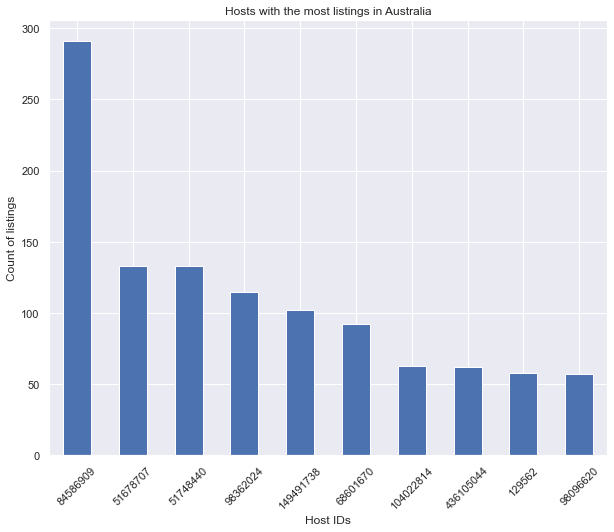

In [28]:
sns.set(rc={'figure.figsize':(10,8)})
viz_bar = top_host_id.plot(kind='bar')
viz_bar.set_title('Hosts with the most listings in Australia')
viz_bar.set_xlabel('Host IDs')
viz_bar.set_ylabel('Count of listings')
viz_bar.set_xticklabels(viz_bar.get_xticklabels(), rotation=45)

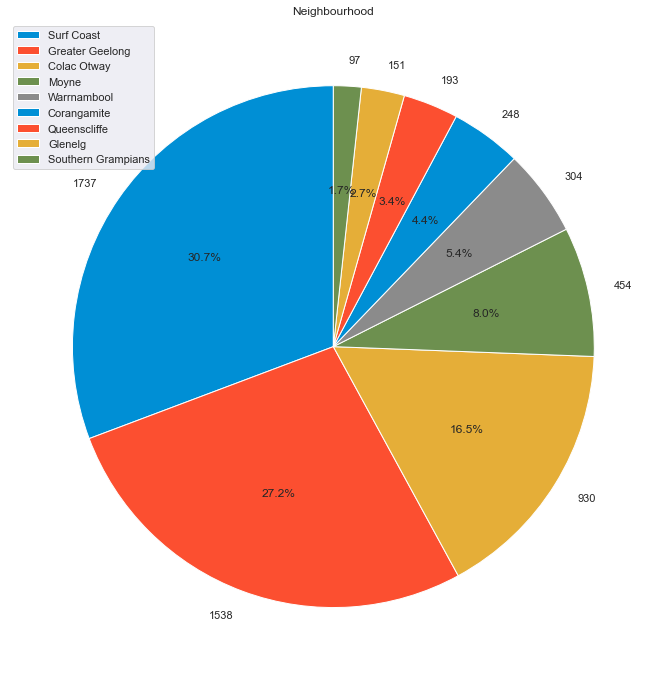

In [29]:
labels = df_listings.neighbourhood.value_counts().index
colors = ['#008fd5','#fc4f30','#e5ae38','#6d904f','#8b8b8b']
explode = (0.1,0,0,0,0)
shape = df_listings.neighbourhood.value_counts().values
plt.figure(figsize=(12,12))
plt.pie(shape, explode = None, labels=shape, colors= colors, autopct = '%1.1f%%', startangle=90)
plt.legend(labels)
plt.title('Neighbourhood')
plt.show()

In [30]:
df_listings.neighbourhood.value_counts().head(10)

Surf Coast            1737
Greater Geelong       1538
Colac Otway            930
Moyne                  454
Warrnambool            304
Corangamite            248
Queenscliffe           193
Glenelg                151
Southern Grampians      97
Name: neighbourhood, dtype: int64

<AxesSubplot:title={'center':'Price Distribution'}, xlabel='price', ylabel='Density'>

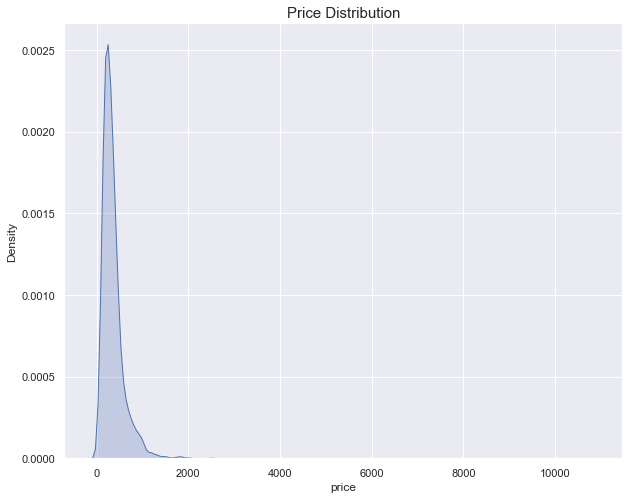

In [31]:
plt.title('Price Distribution',fontsize=15)
sns.kdeplot(df_listings['price'], shade='True', legend='True')

In [32]:
import folium
from folium.plugins import HeatMap
map_folium = folium.Map([-38.043995, 145.264296],zoom_start=11.4)
HeatMap(df_listings[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(map_folium)
display(map_folium)

In [33]:
sf_coord = [-37.8136,144.9631] #Coordination of city of Victoria
sf_map = folium.Map(location=sf_coord,
                    tiles='cartodbpositron',
                    zoom_start=8)
HeatMap(data=df_listings[['latitude', 'longitude']].groupby(['latitude', 'longitude']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(sf_map)
sf_map

## Task 3: Building the Accommodation Prediction Model


<AxesSubplot:>

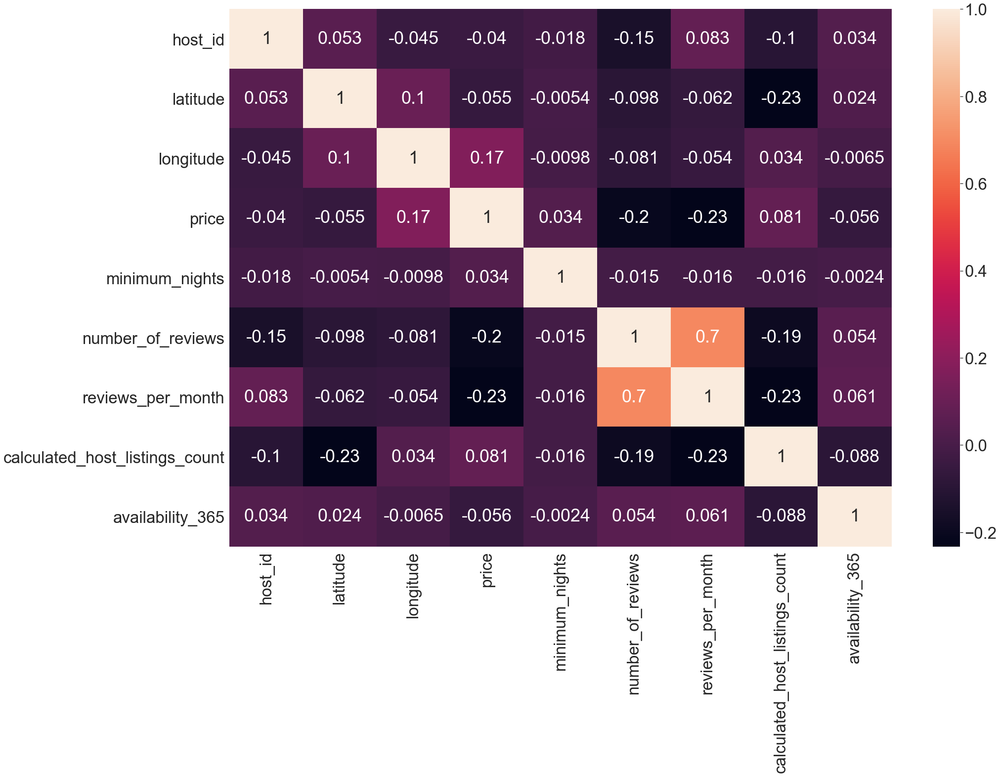

In [34]:
sns.set(font_scale=3)
plt.figure(figsize=(30, 20))
sns.heatmap(df_listings.corr(), annot=True)

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot
import plotly.express as px
from sklearn.model_selection import train_test_split, GridSearchCV

/Users/joestalin/opt/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


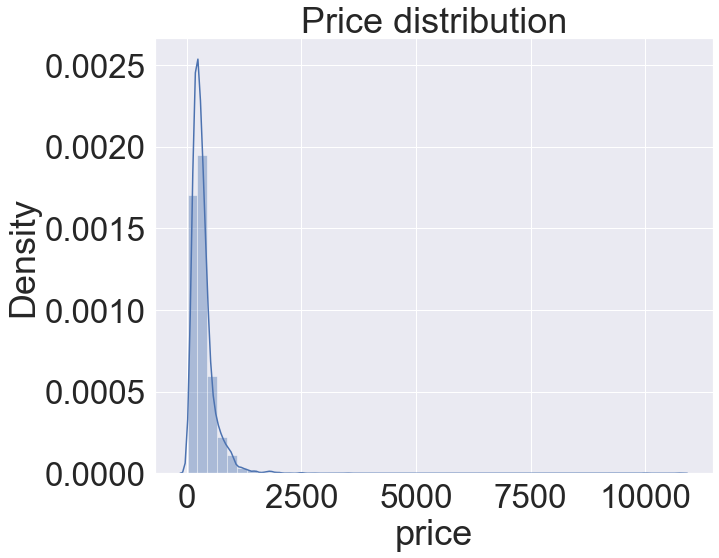

In [36]:
df, validation_df  = train_test_split(df_listings,
                               test_size=0.20,
                               random_state = 101)

df_train, df_test  = train_test_split(df,
                               test_size=0.20,
                               random_state = 101)

plt.figure(figsize = (10, 8))
sns.distplot(df_listings["price"])
plt.title('Price distribution')
plt.show()

In [37]:
df_listings['log_price'] = np.round(df_listings['price'], 2)

<BarContainer object of 9 artists>

<Figure size 720x720 with 0 Axes>

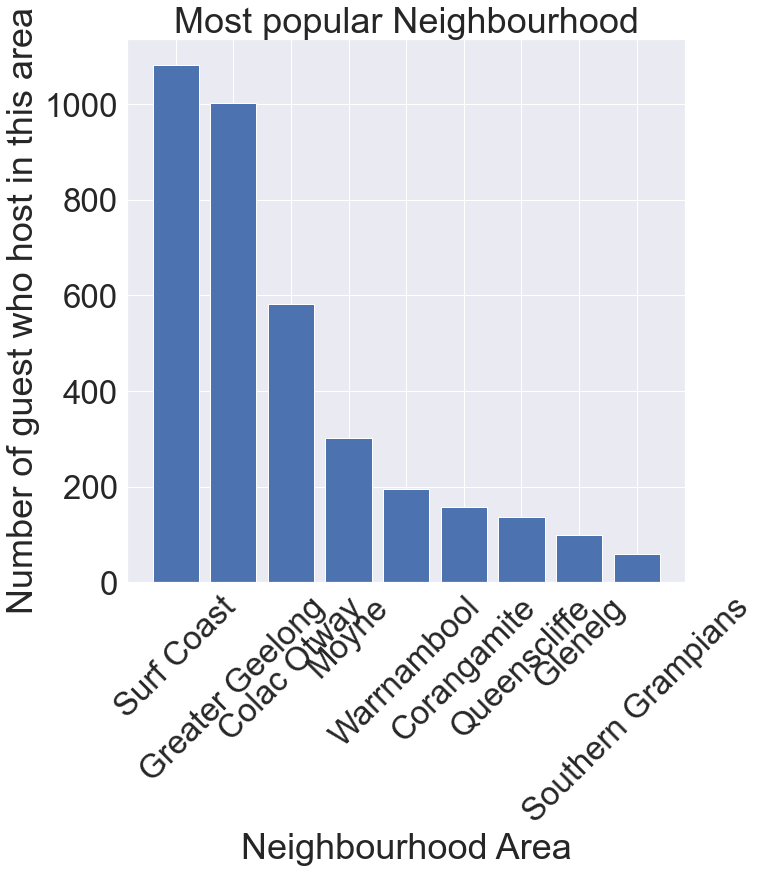

In [38]:
plt.figure(figsize = (10,10))
data = df_train.neighbourhood.value_counts()[:10]
plt.figure(figsize=(10,10))
x = data.index
y = data.values

plt.title("Most popular Neighbourhood")
plt.xlabel("Neighbourhood Area")
plt.ylabel("Number of guest who host in this area")
plt.xticks(rotation=45)
plt.bar(x,y)

In [39]:
df_listings['neighbourhood'].unique()

array(['Surf Coast', 'Colac Otway', 'Moyne', 'Greater Geelong',
       'Queenscliffe', 'Warrnambool', 'Glenelg', 'Southern Grampians',
       'Corangamite'], dtype=object)

In [40]:
x=df_listings[['room_type','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365','neighbourhood']]
y=df_listings['price']
data=x
# Entire home/apt    1
# Private room     2  
# Hotel room       3    
# Shared room      4
x['room_type']=data['room_type'].apply({'Entire home/apt':'1','Private room':'2','Hotel room':'3','Shared room':'4'}.get)

#     'Oostelijk Havengebied - Indische Buurt', 'Centrum-Oost',
#        'Centrum-West', 'De Baarsjes - Oud-West', 'Zuid', 'Oud-Oost',
#        'De Pijp - Rivierenbuurt', 'Slotervaart', 'Bos en Lommer',
#        'IJburg - Zeeburgereiland', 'Watergraafsmeer', 'Westerpark',
#        'Geuzenveld - Slotermeer', 'Noord-Oost', 'Buitenveldert - Zuidas',
#        'Oud-Noord', 'Noord-West', 'De Aker - Nieuw Sloten', 'Osdorp',
#        'Bijlmer-Centrum', 'Gaasperdam - Driemond', 'Bijlmer-Oost'
# Greater Geelong

# x['neighbourhood']=data['neighbourhood'].apply({'Oostelijk Havengebied - Indische Buurt':'1','Centrum-Oost':'2','Centrum-West':'3','De Baarsjes - Oud-West':'4','Zuid':'5',
#                                         'Oud-Oost':'6','De Pijp - Rivierenbuurt':'7','Slotervaart':'8','Bos en Lommer':'9','IJburg - Zeeburgereiland':'10',
#                                          'Watergraafsmeer':'11','Westerpark':'12','Geuzenveld - Slotermeer':'13','Noord-Oost':'14','Buitenveldert - Zuidas':'15',
#                                         'Oud-Noord':'16','Noord-West':'17','De Aker - Nieuw Sloten':'18','Osdorp':'19','Bijlmer-Centrum':'20',
#                                         'Gaasperdam - Driemond':'21','Bijlmer-Oost':'22'
#                                        }.get)




x['neighbourhood']=data['neighbourhood'].apply({'Surf Coast':0, 'Colac Otway':1, 'Moyne':2, 'Greater Geelong':3,
       'Queenscliffe':4, 'Warrnambool':5, 'Glenelg':6, 'Southern Grampians':7,
       'Corangamite':8
                                       }.get)

/Users/joestalin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/joestalin/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [41]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.2)
logmodel=LogisticRegression()
x.isnull().sum()

room_type                         0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
neighbourhood                     0
dtype: int64

In [42]:
logmodel.fit(X_train,y_train)

/Users/joestalin/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression()

In [43]:
predictions=logmodel.predict(X_test)

In [44]:
#accuracy computation
from sklearn.metrics import confusion_matrix, accuracy_score
cm=confusion_matrix(y_test,predictions)
ac=accuracy_score(y_test,predictions)


In [45]:
print(cm)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [46]:
print(ac)


0.019451812555260833


In [47]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf.fit(X_train,y_train);

In [48]:
# Use the forest's predict method on the test data
predictions = rf.predict(X_test)
# rf.predict(X_test)
# cm=confusion_matrix(y_test,predictions)
# ac=accuracy_score(y_test,predictions)
# # Calculate the absolute errors
errors = abs(predictions - y_test)
# # # Print out the mean absolute error (mae)
# # print('confusion matrix', cm, 'degrees.')
# print('Accuracy', ac, 'degrees.')
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')


Mean Absolute Error: 142.64 degrees.


# Sentimental analysis

In [49]:
## Note dont wait untill run this entire fuction it will take huge time so stop it in middle ,go with 

In [51]:
#converting comments to rating 

import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()
for i,row in review.iterrows():

        ss = sid.polarity_scores(row['comments'])
        review.at[i,'pos']=ss['pos']*5
        review.at[i,'neg']=ss['neg']*5
        review.at[i,'neu']=ss['neu']*5
        review.at[i,'rating']=ss['compound']*5
        if ss['compound'] >= 0.06 :
             print("Postive")
             review.at[i,'sentiment']='Positive' 
        elif ss['compound'] <= - 0.05 :
             print("Negative")
             review.at[i,'sentiment']='Negative'
 
        else :
             print("Neutral")
             review.at[i,'sentiment']='Neutral'
               




[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/joestalin/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive

Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Pos

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Neutral
Postive

Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Negative
Neutral
Neutral
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Neutral
Postive
Postive
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive

Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Neutral
Postive
Postive

Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Neutral
Neutral
Postive
Neutral
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Negative
Postive
Neutra

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Negative
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive

Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Negative
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Pos

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Neutral
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Neutral
Neutral
Neutral
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postiv

Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Post

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Post

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Negativ

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Neutral
Neutral
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Neutral
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Post

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Neutral
Neutral
Neutral
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Negative
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Negative
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Po

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Negative
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Negative
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Posti

Postive
Postive
Postive
Neutral
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive

Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Neutral
Postive
Postive


Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Negative
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postive
Postiv

Replace here your querys 

In [52]:
# test=review[review['neg']!=0]
# ss = sid.polarity_scores("Very disappointing stay.   Issues with fireplace were significant and host unresponsive and when he did reply asked us to inappropriately manage.  Would definitely not recommend ")
# print(ss)
# test
# review.head(66)
negative_review=review[review['sentiment']=='Negative']

negative_review

,listing_id,id,date,reviewer_id,reviewer_name,comments,pos,neg,neu,rating,sentiment
62,70449,559859285,2019-11-04,195368256,Trudy,Very disappointing stay. Issues with firepla...,0.725,0.900,3.375,-1.3695,Negative
333,372470,581082560,2019-12-23,154413810,Rajan,good atmosphere but didnt like the fact when ...,0.235,0.455,4.310,-2.8345,Negative
594,479888,124877885,2017-01-02,84206342,James,Beautiful location and surrounds. However as s...,0.355,0.425,4.220,-1.9090,Negative
951,488599,329870059,2018-09-30,415638,Julia,"Pros:<br/>Great location, great communication ...",0.225,0.400,4.375,-3.6685,Negative
1206,562450,553713130626020297,2022-02-02,215816483,Elise,My husband and i didn't stay at this airbnb du...,0.095,0.140,4.765,-1.5910,Negative
...,...,...,...,...,...,...,...,...,...,...,...
256062,53837448,581334154979055255,2022-03-12,50388600,Emily,Location is very convenient for the main strip...,0.270,0.325,4.405,-0.3600,Negative
256126,53868938,532803570391114034,2022-01-04,436947621,Jean,Great location and host but unfortunately that...,0.155,0.355,4.495,-2.5935,Negative
256141,53868938,582088622766827229,2022-03-13,56952601,Tanzina,This place is not quiet at all!<br/>Yes the pr...,0.000,0.830,4.170,-4.8665,Negative
256155,53883260,567577197289319874,2022-02-21,384174634,Karina,Not good communication,0.000,2.730,2.270,-1.7060,Negative


In [53]:
from sklearn.feature_extraction.text import CountVectorizer
pattern = "(?u)\\b[\\w-]+\\b"

# initialise the count vectorizer

vectorizer = CountVectorizer(analyzer = 'word', ngram_range = (1, 2),token_pattern=pattern)
                            
# join the processed data to be vectorised

vectors = []

for index, row in negative_review.iterrows():
    vectors.append(", ".join(row['comments']))

vectorised = vectorizer.fit_transform(vectors)

print(vectorised)

  (0, 1066)	2
  (0, 414)	18
  (0, 883)	8
  (0, 1154)	5
  (0, 372)	9
  (0, 576)	15
  (0, 940)	11
  (0, 272)	11
  (0, 833)	8
  (0, 792)	8
  (0, 749)	14
  (0, 985)	9
  (0, 497)	3
  (0, 1032)	4
  (0, 1092)	4
  (0, 538)	4
  (0, 460)	3
  (0, 664)	5
  (0, 343)	3
  (0, 631)	1
  (0, 708)	3
  (0, 1071)	2
  (0, 441)	2
  (0, 918)	1
  (0, 1167)	1
  :	:
  (2043, 773)	1
  (2043, 357)	1
  (2043, 812)	1
  (2043, 311)	1
  (2043, 520)	1
  (2043, 814)	2
  (2043, 803)	1
  (2043, 802)	2
  (2043, 351)	2
  (2043, 676)	1
  (2043, 289)	1
  (2043, 1014)	1
  (2043, 686)	1
  (2043, 811)	2
  (2043, 318)	1
  (2043, 438)	1
  (2043, 953)	1
  (2043, 594)	1
  (2043, 400)	1
  (2043, 951)	1
  (2043, 393)	1
  (2043, 731)	2
  (2043, 592)	1
  (2043, 673)	1
  (2043, 552)	1


In [54]:
from sklearn.decomposition import LatentDirichletAllocation
# initisalise LDA Model

lda_model = LatentDirichletAllocation(n_components = 5, # number of topics
                                  random_state = 10,          # random state
                                  evaluate_every = -1,      # compute perplexity every n iters, default: Don't
                                  n_jobs = -1,              # Use all available CPUs
                                 )

lda_output = lda_model.fit_transform(vectorised)

# column names

topic_names = ["Reason" + str(i) for i in range(1, lda_model.n_components + 1)]

# make the pandas dataframe

df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns = topic_names)

# get dominant topic for each document

dominant_topic = (np.argmax(df_document_topic.values, axis=1)+1)
df_document_topic['Dominant_topic'] = dominant_topic

# join to original dataframes


## Here you have to merge properly 

df = pd.merge(negative_review, df_document_topic, left_index = True, right_index = True, how = 'outer')
# df=negative_review[0].join(df_document_topic)
display(df.head(10))

,listing_id,id,date,reviewer_id,reviewer_name,comments,pos,neg,neu,rating,sentiment,Reason1,Reason2,Reason3,Reason4,Reason5,Dominant_topic
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.88,0.0,0.00,0.0,0.12,1.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.53,0.0,0.00,0.0,0.47,1.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.25,0.0,0.00,0.0,0.75,5.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.32,0.0,0.00,0.0,0.68,5.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.14,0.0,0.00,0.0,0.86,5.0
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.58,0.0,0.00,0.0,0.42,1.0
6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.82,0.0,0.17,0.0,0.00,1.0
7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.28,0.0,0.00,0.0,0.72,5.0
8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.32,0.0,0.01,0.0,0.67,5.0
9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.0,0.00,0.0,0.99,5.0


In [58]:
df['Dominant_topic'].value_counts()

5.0    926
1.0    822
3.0    293
4.0      2
2.0      1
Name: Dominant_topic, dtype: int64

# Compliant List


<BarContainer object of 5 artists>

<Figure size 720x720 with 0 Axes>

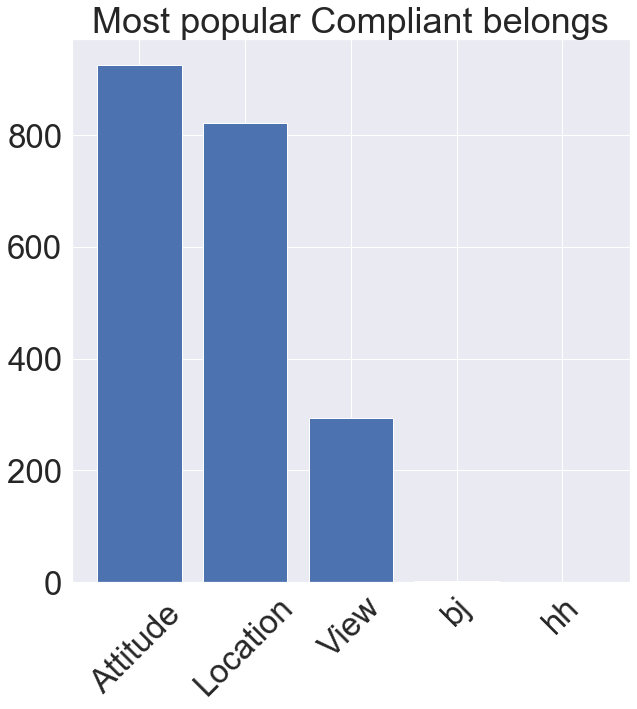

In [69]:
plt.figure(figsize = (10,10))
data = df_train.neighbourhood.value_counts()[:10]
plt.figure(figsize=(10,10))
x = df['Dominant_topic'].value_counts().index
x =['Attitude ','Location','View','bj','hh']


y = df['Dominant_topic'].value_counts().values

plt.title("Most popular Compliant belongs")
# plt.xlabel("Complaint on three categories")
#plt.ylabel("Number of guest who host in this area")
plt.xticks(rotation=45)
plt.bar(x,y)

# Implement Ann Model

In [72]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
%config InlineBackend.figure_format = 'svg'

In [ ]:
px.scatter_3d(df_listings,x='latitude',y='price',z='longitude',opacity=0.5)
# neighbourhood_group	neighbourhood	latitude	longitude	room_type	price	minimum_nights	number_of_reviews	last_review	reviews_per_month	calculated_host_listings_count	availability_365


In [ ]:
learning_rate = 0.01
epochs=250

In [ ]:
n_samples = 30
train_x=
train_y=

In [ ]:
nltk.download('punkt')
nltk.download('wordnet')               
sentences=[]

ps = PorterStemmer()
wordnet=WordNetLemmatizer()

for i,row in negative_review.iterrows():
#     sentences=nltk.sent_tokenize()
    sentences.append(nltk.sent_tokenize(row['comments']))
#      sentences.append(nltk.sent_tokenize(paragraph))
    
corpus = []
for itext in sentences:
    for jtext in itext:
        comment = re.sub('[^a-zA-Z]', ' ', jtext)
        comment = comment.lower()
        comment = comment.split()
        comment = [wordnet.lemmatize(word) for word in comment if not word in set(stopwords.words('english'))]
        comment = ' '.join(comment)
        corpus.append(comment)
print(corpus)

In [ ]:
##Secound approch 

In [ ]:
## bag of words and to find most frequent used words to get exact problem

#Note this will take huge time to train machine

nltk.download('punkt')
nltk.download('wordnet')               
sentences=[]

ps = PorterStemmer()
wordnet=WordNetLemmatizer()
for i,row in review.iterrows():
    sentences.append(row['comments'])
#      sentences.append(nltk.sent_tokenize(paragraph))
    
corpus = []
for i in range(len(sentences)):
    comment = re.sub('[^a-zA-Z]', ' ', sentences[i])
    comment = comment.lower()
    comment = comment.split()
    comment = [wordnet.lemmatize(word) for word in comment if not word in set(stopwords.words('english'))]
    comment = ' '.join(comment)
    corpus.append(comment)
    
# Creating the TF-IDF model
from sklearn.feature_extraction.text import TfidfVectorizer
cv = TfidfVectorizer()
tfidf_model = cv.fit_transform(corpus).toarray()


In [ ]:
print('trained shape : ',tfidf_model.shape,' existing review shape : ' ,review.shape)

In [ ]:
X1_train,X1_test,y1_train,y1_test=train_test_split(tfidf_model,review['rating'],test_size=0.2)

